In [1]:
from urllib.request import urlretrieve
import os
import tarfile
import cv2
import pprint
import operator

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import torchvision.models as models


In [2]:
URL_CALTECH_101_DATA = 'https://data.caltech.edu/records/mzrjq-6wc02/files/caltech-101.zip?download=1'

current_directory = os.path.dirname(os.path.realpath('__file__'))
dataset_file_path = current_directory+"/dataset.zip"
if os.path.exists(dataset_file_path):
    print("Already downloaded.")
else:
    filename, headers = urlretrieve(URL_CALTECH_101_DATA, dataset_file_path)        
print("Done")

Done


In [3]:
%%capture --no-display
! unzip /kaggle/working/dataset.zip

In [4]:
! ls /kaggle/working/caltech-101 

101_ObjectCategories.tar.gz  Annotations.tar  show_annotation.m


In [5]:

tar = tarfile.open('/kaggle/working/caltech-101/101_ObjectCategories.tar.gz', "r:gz")
tar.extractall(path='./data/')
tar.close()
print("Data extracted")

Data extracted


In [6]:
data_directory = "/kaggle/working/data"
categories = os.listdir(data_directory + "/101_ObjectCategories/")
object_images_count_dict = {}
for category in categories:
    object_images_count_dict[category] = len(os.listdir(data_directory+"/101_ObjectCategories/"+category))
object_images_count_dict = sorted(object_images_count_dict.items(), key=operator.itemgetter(1), reverse=True)
print(object_images_count_dict)

[('airplanes', 800), ('Motorbikes', 798), ('BACKGROUND_Google', 468), ('Faces_easy', 435), ('Faces', 435), ('watch', 239), ('Leopards', 200), ('bonsai', 128), ('car_side', 123), ('ketch', 114), ('chandelier', 107), ('hawksbill', 100), ('grand_piano', 99), ('brain', 98), ('butterfly', 91), ('helicopter', 88), ('menorah', 87), ('kangaroo', 86), ('trilobite', 86), ('starfish', 86), ('buddha', 85), ('sunflower', 85), ('ewer', 85), ('scorpion', 84), ('revolver', 82), ('laptop', 81), ('ibis', 80), ('llama', 78), ('minaret', 76), ('electric_guitar', 75), ('umbrella', 75), ('crab', 73), ('crayfish', 70), ('cougar_face', 69), ('dragonfly', 68), ('dalmatian', 67), ('flamingo', 67), ('ferry', 67), ('lotus', 66), ('dolphin', 65), ('elephant', 64), ('stop_sign', 64), ('joshua_tree', 64), ('euphonium', 64), ('soccer_ball', 64), ('schooner', 63), ('chair', 62), ('lamp', 61), ('yin_yang', 60), ('cellphone', 59), ('wheelchair', 59), ('rhino', 59), ('stegosaurus', 59), ('pyramid', 57), ('sea_horse', 57)

In [7]:
len(object_images_count_dict)


102

In [8]:
#get five random classes with there images count
import random
random_classes = random.sample(object_images_count_dict, 5)
print(random_classes)


[('electric_guitar', 75), ('bonsai', 128), ('mayfly', 40), ('crocodile_head', 51), ('dalmatian', 67)]


In [9]:
class ImageSearch(nn.Module):
    def __init__(self):
        super(ImageSearch, self).__init__()
        self.resnet50 = models.resnet50(pretrained=True)

    def forward(self, x):
        resnet50_features = self.resnet50(x)

        return resnet50_features

In [10]:
# define the model
model = ImageSearch()
model.eval()

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 211MB/s]


ImageSearch(
  (resnet50): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
     

In [11]:
# define the image transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
)])

In [12]:
# get the random classes images and extract the features as X
# then clustre them using kmeans then plot them clustered
from tqdm import tqdm
from PIL import Image

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

X = []
for random_class in tqdm(random_classes):
    class_name = random_class[0]
    class_images = os.listdir('data'+"/101_ObjectCategories/"+class_name)
    for class_image in class_images:
        image = cv2.imread(data_directory+"/101_ObjectCategories/"+class_name+"/"+class_image)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = Image.fromarray(image)
        image = transform(image)
        image = image.unsqueeze(0)
        feature = model(image)
        feature = feature.detach().numpy()
        feature = feature.reshape(-1)
        X.append(feature)
X = np.array(X)
print(X.shape)

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
100%|██████████| 5/5 [00:44<00:00,  8.91s/it]

(361, 1000)


In [13]:

kmeans = KMeans(n_clusters=5).fit(X)
print(kmeans.labels_)


/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 4 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 4 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


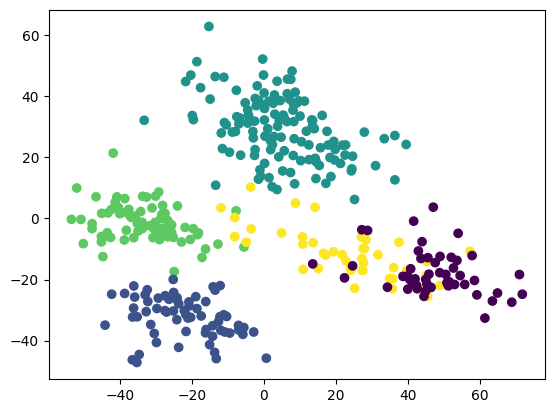

In [14]:
#plot clusters
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=kmeans.labels_)
plt.show()




In [15]:
# now get we will search for similar images to the query image using cosine similarity
# we will
# 1- get the query image and extract its features
# 2- get the features of all images in random classes
# 3- get top 5 similar images to the query image
# 4- plot the query image and the top 5 similar images

from PIL import Image
from sklearn.metrics.pairwise import cosine_similarity

query_image = cv2.imread('data'+"/101_ObjectCategories/"+random_classes[0][0]+"/"+os.listdir(data_directory+"/101_ObjectCategories/"+random_classes[0][0])[0])
query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)
query_image = Image.fromarray(query_image)

query_image = transform(query_image)
query_image = query_image.unsqueeze(0)
query_feature = model(query_image)
query_feature = query_feature.detach().numpy()
query_feature = query_feature.reshape(-1)

In [33]:
similar_images = []
for random_class in random_classes:
    class_name = random_class[0]
    class_images = os.listdir('data'+"/101_ObjectCategories/"+class_name)
    for class_image in tqdm(class_images):
        image = cv2.imread('data'+"/101_ObjectCategories/"+class_name+"/"+class_image)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = Image.fromarray(image)
        image = transform(image)
        image = image.unsqueeze(0)
        feature = model(image)
        feature = feature.detach().numpy()
        feature = feature.reshape(-1)
        similarity = cosine_similarity([query_feature], [feature])
        similar_images.append((class_name+"/"+class_image, similarity))


100%|██████████| 67/67 [00:08<00:00,  8.03it/s]


In [34]:
similar_images = sorted(similar_images, key=operator.itemgetter(1), reverse=True)
print(similar_images[:5])


[('electric_guitar/image_0063.jpg', array([[1.0000002]], dtype=float32)), ('electric_guitar/image_0072.jpg', array([[0.80519116]], dtype=float32)), ('electric_guitar/image_0036.jpg', array([[0.7747632]], dtype=float32)), ('electric_guitar/image_0040.jpg', array([[0.741922]], dtype=float32)), ('electric_guitar/image_0039.jpg', array([[0.73535115]], dtype=float32))]


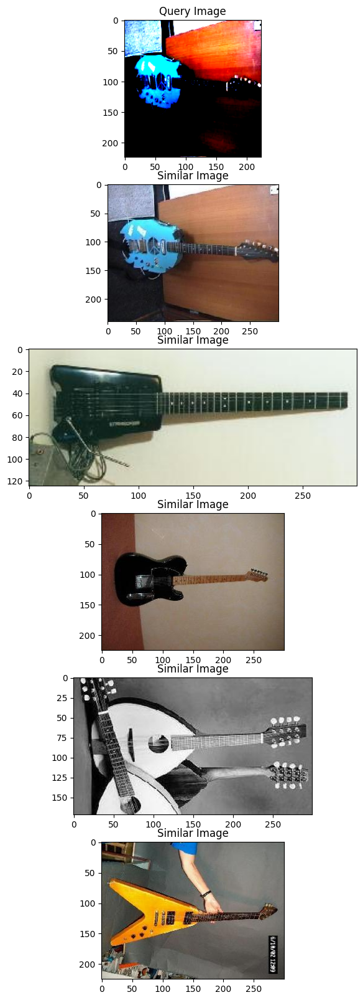

In [35]:
# plot the query image and the top 5 similar images
plt.figure(figsize=(20, 20))
plt.subplot(6, 1, 1)
plt.imshow(query_image.squeeze().permute(1, 2, 0))
plt.title("Query Image")
for i in range(5):
    plt.subplot(6, 1, i+2)
    image = cv2.imread(data_directory+"/101_ObjectCategories/"+similar_images[i][0])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.title("Similar Image")
plt.show()


In [46]:
# make a function to search for similar images
def search_similar_images(query_image_path):
    query_image = cv2.imread(query_image_path)
    query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)
    query_image = Image.fromarray(query_image)

    query_image = transform(query_image)
    query_image = query_image.unsqueeze(0)
    query_feature = model(query_image)
    query_feature = query_feature.detach().numpy()
    query_feature = query_feature.reshape(-1)

    similar_images = []
    for random_class in random_classes:
        class_name = random_class[0]
        class_images = os.listdir(data_directory+"/101_ObjectCategories/"+class_name)
        for class_image in tqdm(class_images):
            image = cv2.imread(data_directory+"/101_ObjectCategories/"+class_name+"/"+class_image)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = Image.fromarray(image)

            image = transform(image)
            image = image.unsqueeze(0)
            feature = model(image)
            feature = feature.detach().numpy()
            feature = feature.reshape(-1)
            similarity = cosine_similarity([query_feature], [feature])
            similar_images.append((class_name+"/"+class_image, similarity))

    similar_images = sorted(similar_images, key=operator.itemgetter(1), reverse=True)
    print(similar_images[:5])

    plt.figure(figsize=(20, 20))
    plt.subplot(6, 1, 1)
    plt.imshow(query_image.squeeze().permute(1, 2, 0))
    plt.title("Query Image")
    for i in range(5):
        plt.subplot(6, 1, i+2)
        image = cv2.imread(data_directory+"/101_ObjectCategories/"+similar_images[i][0])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = Image.fromarray(image)
        plt.imshow(image)
        plt.title("Similar Image")
    plt.show()


100%|██████████| 67/67 [00:08<00:00,  7.55it/s]


[('electric_guitar/image_0063.jpg', array([[1.0000002]], dtype=float32)), ('electric_guitar/image_0072.jpg', array([[0.80519116]], dtype=float32)), ('electric_guitar/image_0036.jpg', array([[0.7747632]], dtype=float32)), ('electric_guitar/image_0040.jpg', array([[0.741922]], dtype=float32)), ('electric_guitar/image_0039.jpg', array([[0.73535115]], dtype=float32))]


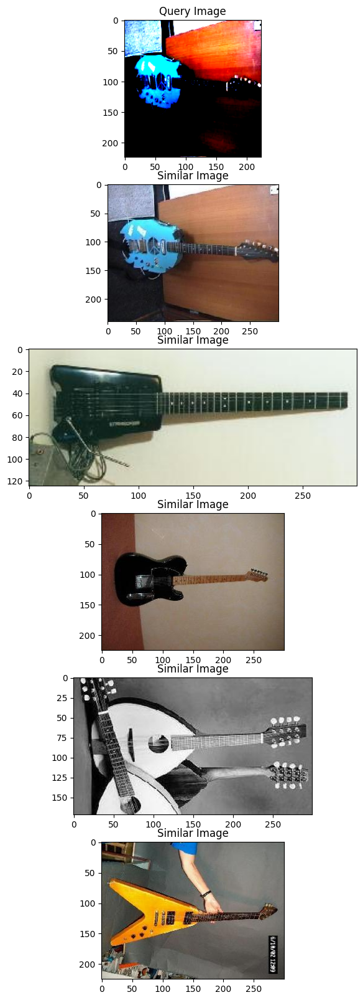

In [47]:
image_path = 'data'+"/101_ObjectCategories/"+random_classes[0][0]+"/"+os.listdir(data_directory+"/101_ObjectCategories/"+random_classes[0][0])[0]
search_similar_images(image_path)


In [48]:
random_images = []
for random_class in tqdm(random_classes):
    class_name = random_class[0]
    class_images = os.listdir('data'+"/101_ObjectCategories/"+class_name)
    for class_image in class_images:
        random_images.append('data'+"/101_ObjectCategories/"+class_name+"/"+class_image)

random_images = random.sample(random_images, 10)

100%|██████████| 5/5 [00:00<00:00, 3584.88it/s]


In [49]:
random_images

['data/101_ObjectCategories/bonsai/image_0042.jpg',
 'data/101_ObjectCategories/dalmatian/image_0013.jpg',
 'data/101_ObjectCategories/bonsai/image_0097.jpg',
 'data/101_ObjectCategories/dalmatian/image_0022.jpg',
 'data/101_ObjectCategories/bonsai/image_0051.jpg',
 'data/101_ObjectCategories/dalmatian/image_0027.jpg',
 'data/101_ObjectCategories/dalmatian/image_0066.jpg',
 'data/101_ObjectCategories/dalmatian/image_0030.jpg',
 'data/101_ObjectCategories/crocodile_head/image_0044.jpg',
 'data/101_ObjectCategories/dalmatian/image_0056.jpg']

100%|██████████| 67/67 [00:08<00:00,  7.96it/s]


[('dalmatian/image_0027.jpg', array([[0.9999999]], dtype=float32)), ('dalmatian/image_0046.jpg', array([[0.9040943]], dtype=float32)), ('dalmatian/image_0035.jpg', array([[0.86387694]], dtype=float32)), ('dalmatian/image_0025.jpg', array([[0.84595317]], dtype=float32)), ('dalmatian/image_0026.jpg', array([[0.81921697]], dtype=float32))]


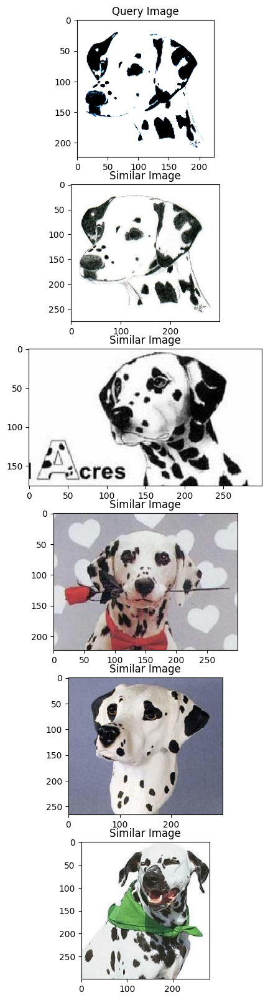

In [50]:
search_similar_images(random_images[5])


100%|██████████| 67/67 [00:08<00:00,  8.06it/s]


[('dalmatian/image_0066.jpg', array([[0.99999994]], dtype=float32)), ('dalmatian/image_0032.jpg', array([[0.8213313]], dtype=float32)), ('dalmatian/image_0045.jpg', array([[0.74217504]], dtype=float32)), ('dalmatian/image_0060.jpg', array([[0.7388687]], dtype=float32)), ('dalmatian/image_0020.jpg', array([[0.73525226]], dtype=float32))]


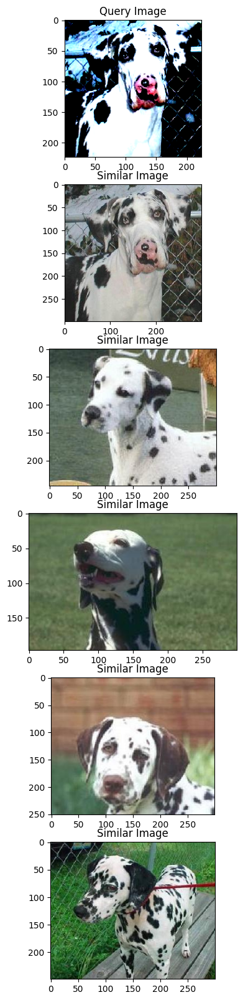

In [51]:
search_similar_images(random_images[6])


100%|██████████| 67/67 [00:08<00:00,  7.67it/s]


[('dalmatian/image_0013.jpg', array([[1.0000002]], dtype=float32)), ('dalmatian/image_0026.jpg', array([[0.85996664]], dtype=float32)), ('dalmatian/image_0016.jpg', array([[0.8575409]], dtype=float32)), ('dalmatian/image_0054.jpg', array([[0.8544141]], dtype=float32)), ('dalmatian/image_0025.jpg', array([[0.84058857]], dtype=float32))]


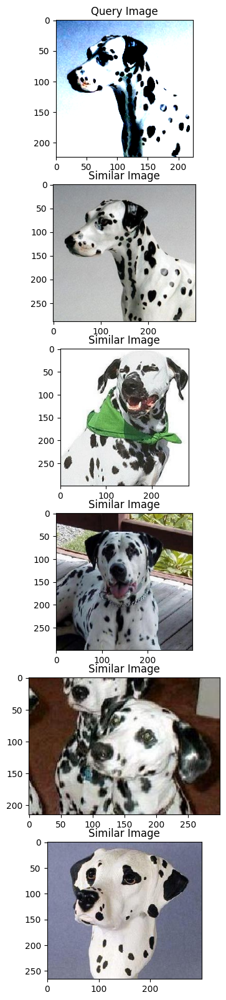

In [52]:
search_similar_images(random_images[1])


100%|██████████| 67/67 [00:08<00:00,  8.19it/s]


[('crocodile_head/image_0044.jpg', array([[1.]], dtype=float32)), ('crocodile_head/image_0018.jpg', array([[0.8950453]], dtype=float32)), ('crocodile_head/image_0049.jpg', array([[0.88818926]], dtype=float32)), ('crocodile_head/image_0029.jpg', array([[0.8713435]], dtype=float32)), ('crocodile_head/image_0002.jpg', array([[0.8436298]], dtype=float32))]


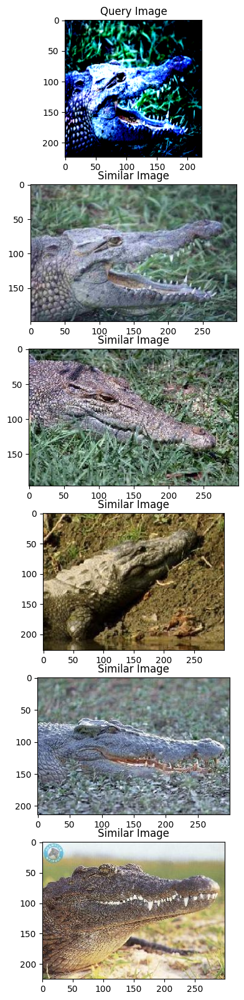

In [53]:
search_similar_images(random_images[8])


In [54]:
random_images = []
for random_class in tqdm(random_classes):
    class_name = random_class[0]
    class_images = os.listdir('data'+"/101_ObjectCategories/"+class_name)
    for class_image in class_images:
        random_images.append('data'+"/101_ObjectCategories/"+class_name+"/"+class_image)

random_images = random.sample(random_images, 10)

100%|██████████| 5/5 [00:00<00:00, 3534.72it/s]


In [55]:
random_images

['data/101_ObjectCategories/mayfly/image_0025.jpg',
 'data/101_ObjectCategories/mayfly/image_0006.jpg',
 'data/101_ObjectCategories/mayfly/image_0010.jpg',
 'data/101_ObjectCategories/electric_guitar/image_0048.jpg',
 'data/101_ObjectCategories/dalmatian/image_0045.jpg',
 'data/101_ObjectCategories/bonsai/image_0112.jpg',
 'data/101_ObjectCategories/crocodile_head/image_0001.jpg',
 'data/101_ObjectCategories/electric_guitar/image_0023.jpg',
 'data/101_ObjectCategories/dalmatian/image_0064.jpg',
 'data/101_ObjectCategories/dalmatian/image_0013.jpg']

100%|██████████| 67/67 [00:08<00:00,  7.85it/s]


[('mayfly/image_0025.jpg', array([[0.9999999]], dtype=float32)), ('mayfly/image_0014.jpg', array([[0.72851545]], dtype=float32)), ('mayfly/image_0024.jpg', array([[0.66607064]], dtype=float32)), ('mayfly/image_0009.jpg', array([[0.6570514]], dtype=float32)), ('mayfly/image_0016.jpg', array([[0.6555847]], dtype=float32))]


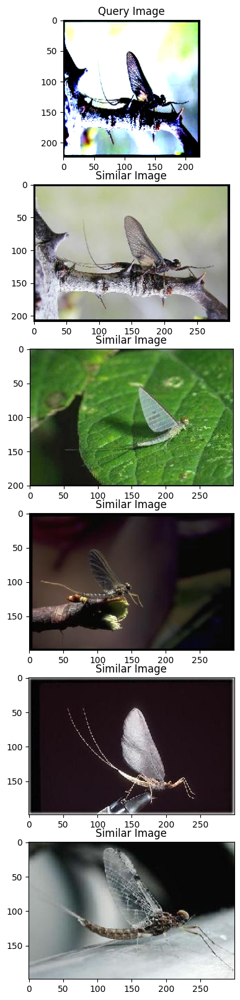

100%|██████████| 67/67 [00:08<00:00,  8.21it/s]


[('mayfly/image_0006.jpg', array([[0.9999998]], dtype=float32)), ('mayfly/image_0034.jpg', array([[0.74586284]], dtype=float32)), ('mayfly/image_0008.jpg', array([[0.7000602]], dtype=float32)), ('mayfly/image_0011.jpg', array([[0.67892975]], dtype=float32)), ('electric_guitar/image_0003.jpg', array([[0.57325196]], dtype=float32))]


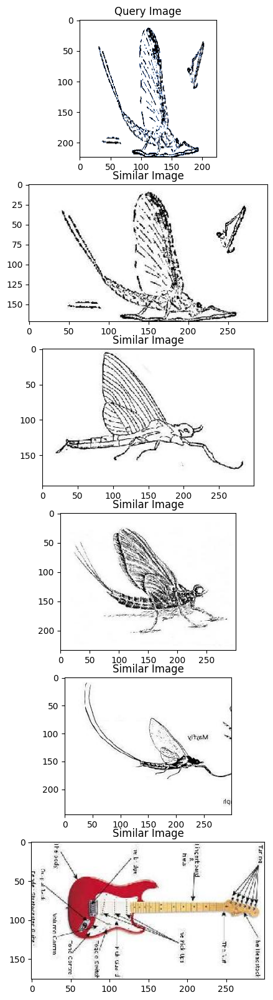

100%|██████████| 67/67 [00:08<00:00,  8.23it/s]


[('mayfly/image_0010.jpg', array([[0.99999994]], dtype=float32)), ('mayfly/image_0016.jpg', array([[0.7023474]], dtype=float32)), ('mayfly/image_0021.jpg', array([[0.619393]], dtype=float32)), ('mayfly/image_0013.jpg', array([[0.61028296]], dtype=float32)), ('mayfly/image_0025.jpg', array([[0.60983574]], dtype=float32))]


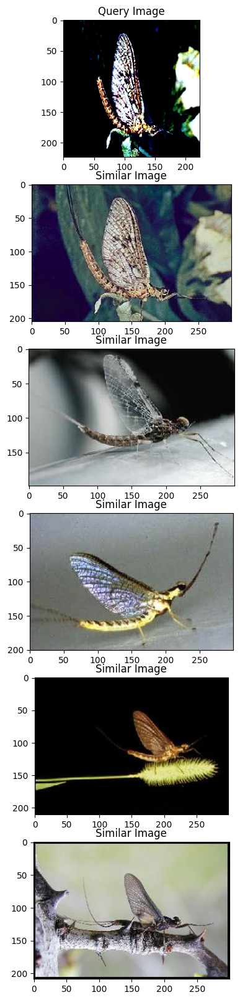

100%|██████████| 67/67 [00:07<00:00,  8.85it/s]


[('electric_guitar/image_0048.jpg', array([[1.]], dtype=float32)), ('electric_guitar/image_0049.jpg', array([[0.8540733]], dtype=float32)), ('electric_guitar/image_0064.jpg', array([[0.8204769]], dtype=float32)), ('electric_guitar/image_0070.jpg', array([[0.8147509]], dtype=float32)), ('electric_guitar/image_0019.jpg', array([[0.7914343]], dtype=float32))]


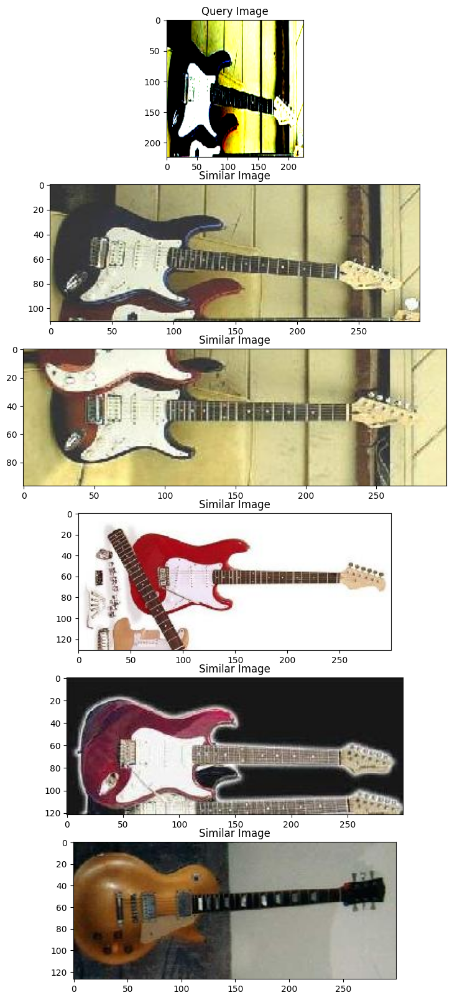

100%|██████████| 67/67 [00:07<00:00,  8.80it/s]


[('dalmatian/image_0045.jpg', array([[1.0000001]], dtype=float32)), ('dalmatian/image_0023.jpg', array([[0.80346537]], dtype=float32)), ('dalmatian/image_0032.jpg', array([[0.7788243]], dtype=float32)), ('dalmatian/image_0020.jpg', array([[0.77408737]], dtype=float32)), ('dalmatian/image_0022.jpg', array([[0.77210665]], dtype=float32))]


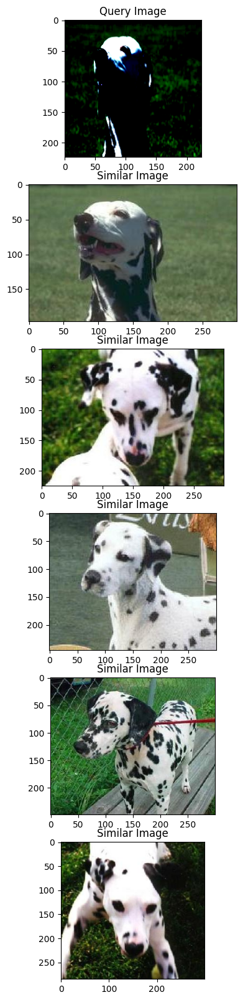

100%|██████████| 67/67 [00:08<00:00,  8.24it/s]


[('bonsai/image_0112.jpg', array([[0.9999999]], dtype=float32)), ('bonsai/image_0069.jpg', array([[0.6448692]], dtype=float32)), ('bonsai/image_0037.jpg', array([[0.6300883]], dtype=float32)), ('bonsai/image_0080.jpg', array([[0.6298311]], dtype=float32)), ('bonsai/image_0077.jpg', array([[0.6259711]], dtype=float32))]


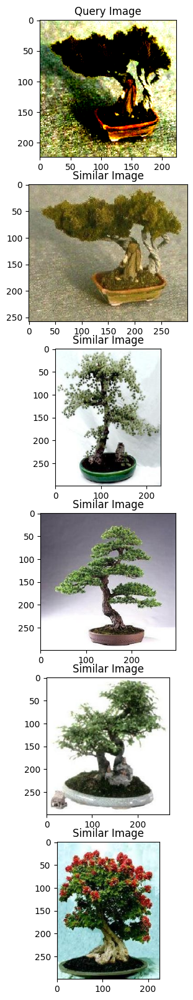

100%|██████████| 67/67 [00:07<00:00,  8.62it/s]


[('crocodile_head/image_0001.jpg', array([[1.]], dtype=float32)), ('crocodile_head/image_0028.jpg', array([[0.768167]], dtype=float32)), ('crocodile_head/image_0027.jpg', array([[0.7647429]], dtype=float32)), ('crocodile_head/image_0035.jpg', array([[0.7606386]], dtype=float32)), ('crocodile_head/image_0036.jpg', array([[0.7572878]], dtype=float32))]


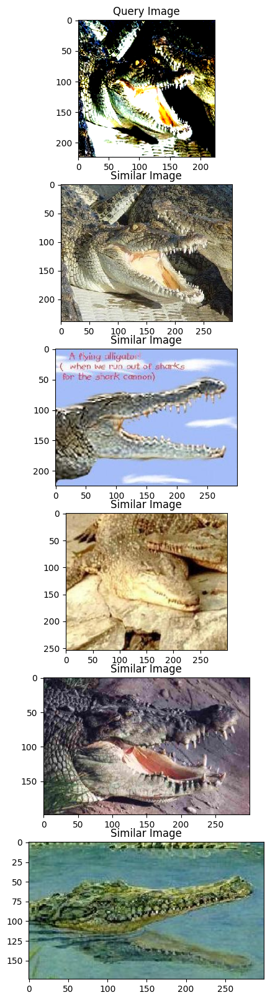

100%|██████████| 67/67 [00:07<00:00,  8.39it/s]


[('electric_guitar/image_0023.jpg', array([[1.]], dtype=float32)), ('electric_guitar/image_0040.jpg', array([[0.7333353]], dtype=float32)), ('electric_guitar/image_0063.jpg', array([[0.64777046]], dtype=float32)), ('electric_guitar/image_0071.jpg', array([[0.61714804]], dtype=float32)), ('electric_guitar/image_0044.jpg', array([[0.6095488]], dtype=float32))]


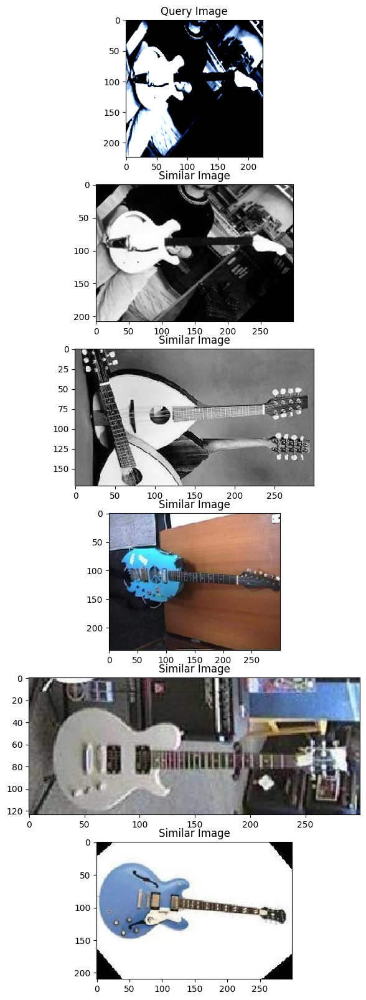

100%|██████████| 67/67 [00:08<00:00,  8.33it/s]


[('dalmatian/image_0064.jpg', array([[0.9999999]], dtype=float32)), ('dalmatian/image_0026.jpg', array([[0.83238083]], dtype=float32)), ('dalmatian/image_0048.jpg', array([[0.8295229]], dtype=float32)), ('dalmatian/image_0006.jpg', array([[0.828512]], dtype=float32)), ('dalmatian/image_0054.jpg', array([[0.8222469]], dtype=float32))]


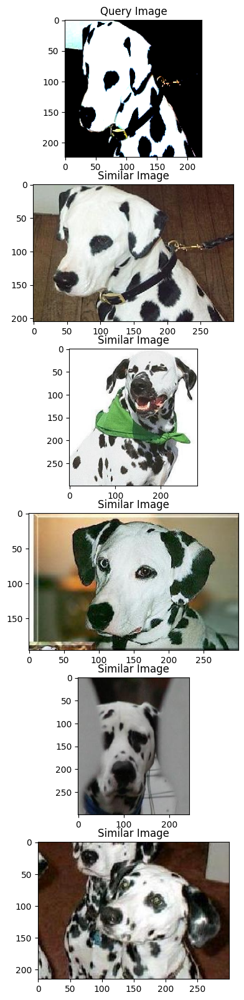

100%|██████████| 67/67 [00:07<00:00,  8.50it/s]


[('dalmatian/image_0013.jpg', array([[1.0000002]], dtype=float32)), ('dalmatian/image_0026.jpg', array([[0.85996664]], dtype=float32)), ('dalmatian/image_0016.jpg', array([[0.8575409]], dtype=float32)), ('dalmatian/image_0054.jpg', array([[0.8544141]], dtype=float32)), ('dalmatian/image_0025.jpg', array([[0.84058857]], dtype=float32))]


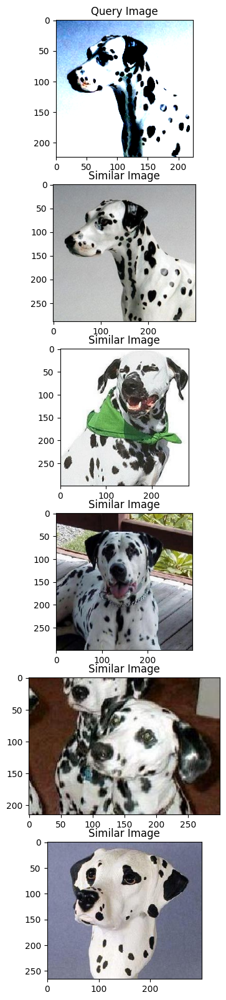

In [56]:
for random_image in random_images:
    search_similar_images(random_image)
    

In [57]:
# load the model
class CNN_without_training(nn.Module):
    def __init__(self):
        super(CNN_without_training, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(32*56*56, 500)
        self.fc2 = nn.Linear(500, 101)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x))) 
        x = x.view(-1, 32*56*56)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [58]:
model2 = CNN_without_training()
model2.eval()


CNN_without_training(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=100352, out_features=500, bias=True)
  (fc2): Linear(in_features=500, out_features=101, bias=True)
)

In [59]:
# make new X for custom model
X2 = []
for random_class in random_classes:
    class_name = random_class[0]
    class_images = os.listdir(data_directory+"/101_ObjectCategories/"+class_name)
    for class_image in class_images:
        image = cv2.imread(data_directory+"/101_ObjectCategories/"+class_name+"/"+class_image)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = Image.fromarray(image)

        image = transform(image)
        image = image.unsqueeze(0)
        feature = model2(image)
        feature = feature.detach().numpy()
        feature = feature.reshape(-1)
        X2.append(feature)

X2 = np.array(X2)

In [63]:
kmeans2 = KMeans(n_clusters=5).fit(X2)
print(kmeans2.labels_)


[2 3 2 2 3 1 3 1 1 4 3 2 2 2 2 0 1 0 3 3 3 1 0 4 2 3 4 1 1 3 3 2 2 2 3 3 0
 2 2 3 2 2 1 3 3 2 0 3 3 2 0 1 3 3 3 1 1 1 0 0 0 3 3 3 1 3 1 2 3 2 3 1 2 1
 2 4 3 2 0 4 4 4 4 4 0 3 4 2 4 2 4 2 2 2 4 3 2 4 4 4 2 4 4 3 3 4 3 4 4 4 1
 3 0 2 2 4 0 2 4 4 4 4 3 3 3 2 3 3 4 1 0 4 4 4 4 2 3 4 4 2 2 4 4 3 0 3 0 2
 0 4 2 4 3 2 2 3 2 3 2 2 4 3 0 2 4 4 2 2 2 3 4 1 2 4 3 2 4 4 3 1 4 3 4 2 3
 2 2 2 0 0 4 4 2 0 4 3 4 2 4 3 4 3 4 2 2 2 3 2 3 2 2 0 3 3 2 2 2 4 1 3 2 3
 1 2 0 0 2 2 3 1 1 2 3 2 2 1 2 0 2 2 2 1 1 3 0 2 2 3 3 2 3 3 0 2 2 2 0 2 2
 2 2 2 2 2 2 2 0 2 2 3 0 0 2 3 2 2 2 0 2 0 2 2 2 3 1 2 2 2 2 1 0 3 2 3 3 2
 0 1 0 2 0 2 0 0 0 2 0 3 0 0 3 0 0 0 0 3 3 0 3 1 0 1 0 0 3 4 2 2 3 2 1 2 2
 3 0 1 1 2 3 3 2 2 0 0 4 2 0 0 2 1 0 0 0 0 3 0 0 2 2 3 0]


/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


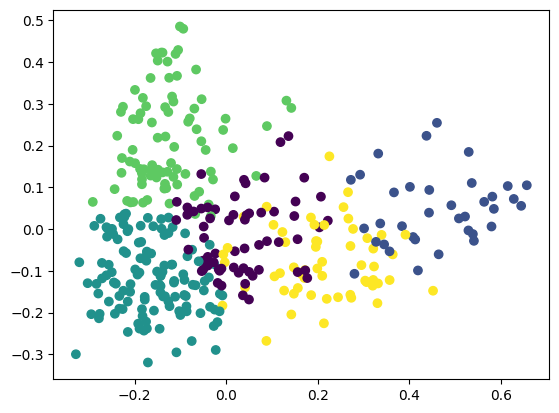

In [65]:
#plot clusters
pca2 = PCA(n_components=2)
X_pca2 = pca2.fit_transform(X2)
plt.scatter(X_pca2[:, 0], X_pca2[:, 1], c=kmeans2.labels_)
plt.show()




In [66]:
# make a function to search for similar images
def search_similar_images2(query_image_path):
    query_image = cv2.imread(query_image_path)
    query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)
    query_image = Image.fromarray(query_image)

    query_image = transform(query_image)
    query_image = query_image.unsqueeze(0)
    query_feature = model2(query_image)
    query_feature = query_feature.detach().numpy()
    query_feature = query_feature.reshape(-1)

    similar_images = []
    for random_class in random_classes:
        class_name = random_class[0]
        class_images = os.listdir(data_directory+"/101_ObjectCategories/"+class_name)
        for class_image in tqdm(class_images):
            image = cv2.imread(data_directory+"/101_ObjectCategories/"+class_name+"/"+class_image)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = Image.fromarray(image)

            image = transform(image)
            image = image.unsqueeze(0)
            feature = model2(image)
            feature = feature.detach().numpy()
            feature = feature.reshape(-1)
            similarity = cosine_similarity([query_feature], [feature])
            similar_images.append((class_name+"/"+class_image, similarity))

    similar_images = sorted(similar_images, key=operator.itemgetter(1), reverse=True)
    print(similar_images[:5])

    plt.figure(figsize=(20, 20))
    plt.subplot(6, 1, 1)
    plt.imshow(query_image.squeeze().permute(1, 2, 0))
    plt.title("Query Image")
    for i in range(5):
        plt.subplot(6, 1, i+2)
        image = cv2.imread(data_directory+"/101_ObjectCategories/"+similar_images[i][0])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = Image.fromarray(image)
        plt.imshow(image)
        plt.title("Similar Image")
    plt.show()

100%|██████████| 67/67 [00:01<00:00, 51.94it/s]


[('dalmatian/image_0064.jpg', array([[0.99999994]], dtype=float32)), ('dalmatian/image_0022.jpg', array([[0.860552]], dtype=float32)), ('bonsai/image_0116.jpg', array([[0.84225065]], dtype=float32)), ('crocodile_head/image_0044.jpg', array([[0.8398158]], dtype=float32)), ('electric_guitar/image_0002.jpg', array([[0.83867013]], dtype=float32))]


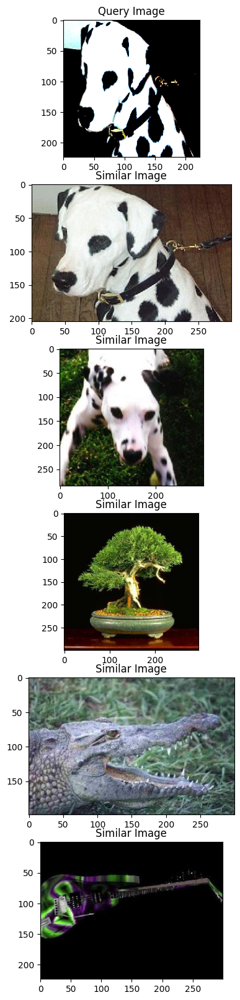

In [67]:
search_similar_images2(random_images[8])


100%|██████████| 67/67 [00:01<00:00, 46.62it/s]


[('mayfly/image_0010.jpg', array([[1.0000001]], dtype=float32)), ('electric_guitar/image_0007.jpg', array([[0.8821393]], dtype=float32)), ('bonsai/image_0040.jpg', array([[0.8712108]], dtype=float32)), ('electric_guitar/image_0073.jpg', array([[0.8701611]], dtype=float32)), ('bonsai/image_0014.jpg', array([[0.8699917]], dtype=float32))]


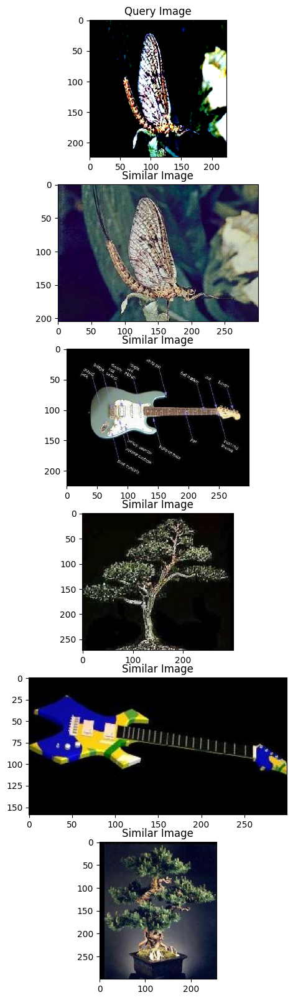

In [68]:
search_similar_images2(random_images[2])